In [10]:
import json
from pycocotools.mask import decode, encode
import numpy as np
import matplotlib.pyplot as plt

result_json_path = r"D:\Master-Thesis_results_all\SAN\middle_middle\sem_seg_predictions.json"
with open(result_json_path, "r") as file:
    data = json.load(file)

data = [i for i in data if i["category_id"] == 1]

In [11]:
# data = [i["category_id"] for i in data]

In [12]:
#set(list(data))

1877.jpg
[[255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 ...
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]]


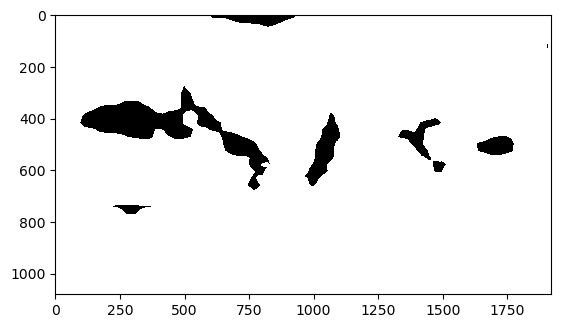

1890.jpg
[[ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]


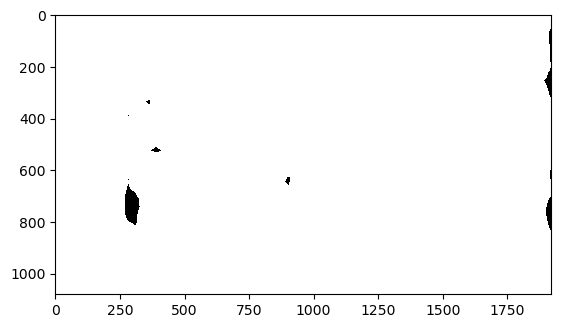

1906.jpg
[[ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]


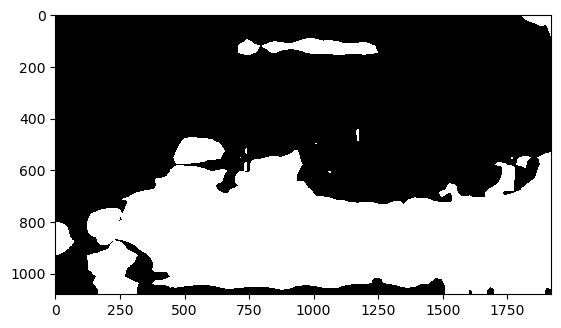

1908.jpg
[[ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]


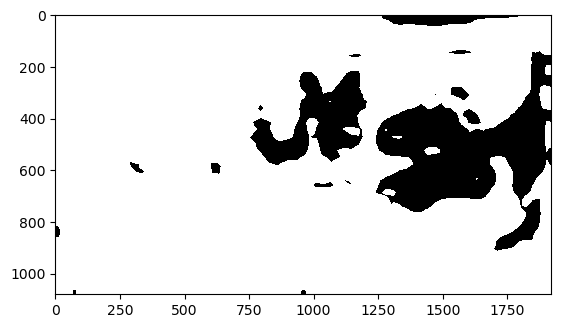

1915.jpg
[[ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]


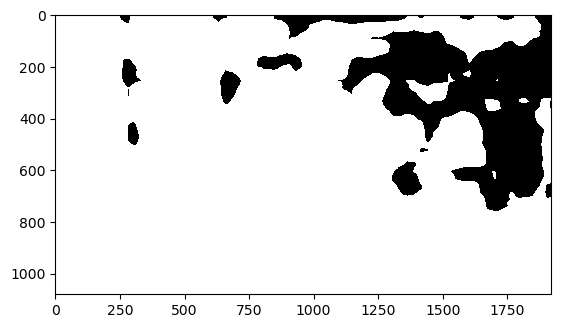

1916.jpg
[[ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]


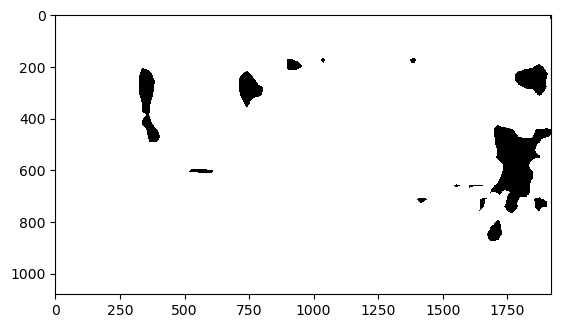

1918.jpg
[[ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]


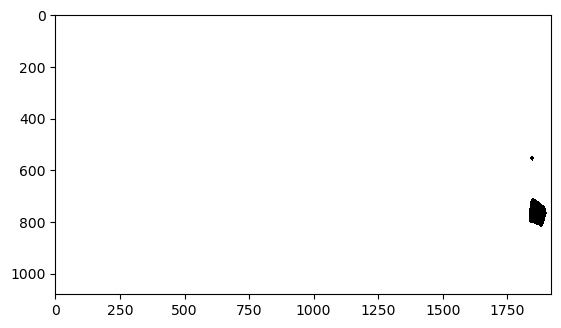

1930.jpg
[[ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]


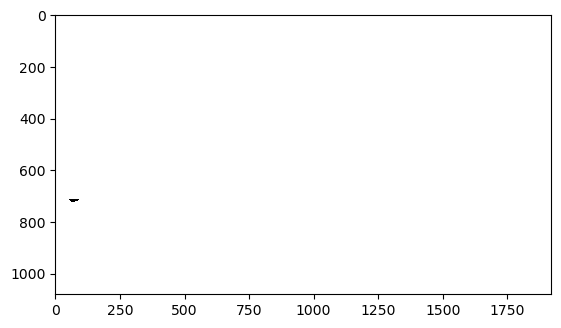

1942.jpg
[[ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]


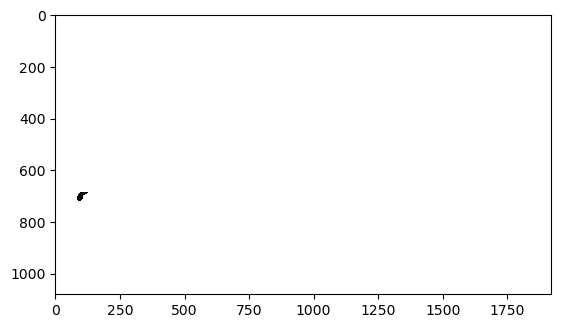

1943.jpg
[[ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]


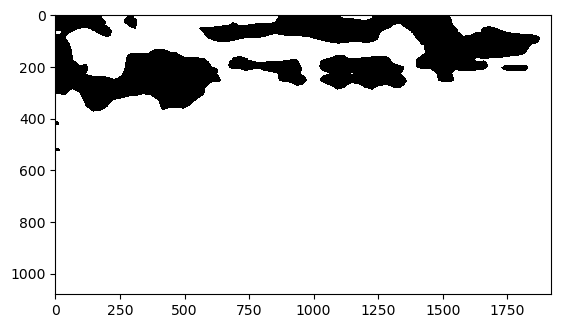

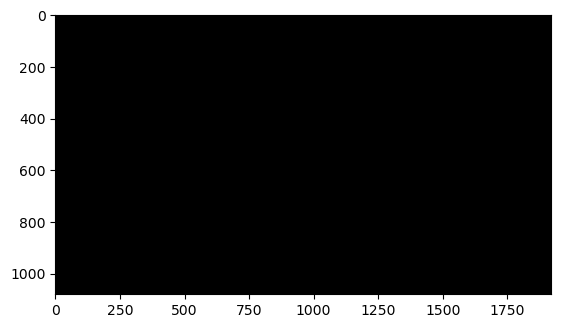

In [13]:
merged_mask = None
for item in data[:10]:
    decoded = decode(item["segmentation"])
    decoded[0, 0] = 0
    decoded[decoded==0] = 255
    # decoded[decoded==1] = 1
    if merged_mask is None:
        merged_mask = decoded
    else:
        merged_mask = np.logical_or(merged_mask, decoded)
    
    print(item["file_name"].split("/")[-1])
    print(merged_mask)
    plt.imshow(decoded, cmap='gray', interpolation='nearest')
    plt.show()

plt.imshow(merged_mask, cmap='gray', interpolation='nearest')
plt.show()

In [1]:
import cv2, os, json
base_image_path = r'D:\Master_Thesis_data\Active_Speaker\data\test\images\\'
result_json_paths = r"D:\Master-Thesis_results_all\SAN\active_speaker_new-single"
                     #0001874\results\inference\sem_seg_predictions.json",
                     #r"D:\Master-Thesis_results_all\SAN\active_speaker-single\model_0013124\results\inference\sem_seg_predictions.json",
                     #r"D:\Master-Thesis_results_all\SAN\active_speaker-single\model_0024374\results\inference\sem_seg_predictions.json",
                     #r"D:\Master-Thesis_results_all\SAN\active_speaker-single\model_0026249\results\inference\sem_seg_predictions.json",
                     #r"D:\Master-Thesis_results_all\SAN\active_speaker-single\model_0029999\results\inference\sem_seg_predictions.json"]

output_path = r'D:\Master-Thesis_results_all\SAN\active_speaker_new-single\test_output\\'
target_file_name = 'sem_seg_predictions.json'

data_dict = {}

for foldername, subfolders, filenames in os.walk(result_json_paths):
    # Check if the target file name is in the current folder
    if target_file_name in filenames:
        file_path = os.path.join(foldername, target_file_name)
        # Execute the subroutine
        # subroutine(file_path)
        
        with open(file_path, "r") as file:
            data = json.load(file)
            print(list(set([i["category_id"] for i in data])))
#         test = [i["category_id"] for i in data]
#         if len(test) != 0:
#             print(len(test))
#             print(test)
#             print(foldername)
#             print(subfolders)
#             print(filenames)
#             raise ValueError()
        print(file_path)
        print(file_path.split("\\")[-2])
        try:
            data_dict[file_path.split("\\")[-4].split("_")[1]] = [i for i in data if i["category_id"] == 1]
        except:
            data_dict[file_path.split("\\")[-2]] = [i for i in data if i["category_id"] == 1]

from matplotlib.patches import Polygon

import json
from pycocotools.mask import decode, encode
import numpy as np
import matplotlib.pyplot as plt


# for path_temp in result_json_paths:
#     print(path_temp)
#     with open(path_temp, "r") as file:
#         data = json.load(file)
    
#     data_dict[path_temp.split("\\")[-3].split("_")[1]] = [i for i in data if i["category_id"] == 1]



# for path in base_image_path:
merged_mask = None

for k, v in data_dict.items():
    for idx, item in enumerate(v):
        print(idx)
        decoded = decode(item["segmentation"])
        #decoded[0, 0] = 0
        #decoded[decoded==0] = 255
        # decoded[decoded==1] = 1
        #if merged_mask is None:
        #    merged_mask = decoded
        #else:
        #    merged_mask = np.logical_or(merged_mask, decoded)

        # print(item["file_name"].split("/")[-1])
        image = plt.imread(base_image_path + item["file_name"].split("/")[-1])
        plt.imshow(image)

        merged_mask = np.clip(decoded, 0, 1)
        plt.imshow(np.ma.masked_array(merged_mask, merged_mask == 0), alpha=0.5, cmap='Reds')  # Adjust the colormap as needed
        plt.savefig(output_path + item["file_name"].split("/")[-1].replace('.jpg', f'_{k}.jpg'))
        plt.close()  # Close the plot to free up resources
        
        #if idx > 100:
        #    print("breaked")
        #    break
        # Find contours in the segmentation mask
    #     contours, _ = cv2.findContours((merged_mask).astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    #     for contour in contours:
    #         poly = Polygon(contour.reshape(-1, 2), edgecolor='red', facecolor='none')
    #         plt.gca().add_patch(poly)
        #plt.imsave(output_path + item["file_name"].split("/")[-1].replace('.jpg', k + '_.jpg'), output_image, cmap='Reds')

[1, 2, 131, 132, 4, 134, 136, 11, 15, 16, 25, 28, 156, 31, 160, 161, 165, 39, 40, 43, 172, 174, 49, 177, 50, 180, 56, 57, 62, 64, 67, 70, 72, 73, 79, 81, 88, 90, 94, 98, 99, 107, 108, 110, 111, 112, 118, 123]
D:\Master-Thesis_results_all\SAN\active_speaker_new-single\model_0001724\sem_seg_predictions.json
model_0001724
[1, 2, 131, 132, 3, 134, 129, 138, 142, 143, 16, 18, 23, 31, 160, 165, 39, 40, 170, 43, 174, 48, 180, 56, 57, 62, 64, 67, 77, 80, 88, 94, 98, 99, 104, 105, 107, 108, 111, 118]
D:\Master-Thesis_results_all\SAN\active_speaker_new-single\model_0003449\sem_seg_predictions.json
model_0003449
[1, 2, 129, 4, 132, 134, 139, 140, 13, 142, 18, 23, 160, 32, 164, 39, 40, 170, 43, 173, 181, 56, 57, 62, 64, 67, 72, 79, 88, 94, 98, 99, 105, 107, 108, 111, 112, 115, 123, 125]
D:\Master-Thesis_results_all\SAN\active_speaker_new-single\model_0005174\sem_seg_predictions.json
model_0005174
[1, 2, 129, 132, 4, 134, 8, 13, 142, 16, 18, 23, 160, 32, 164, 39, 40, 170, 43, 172, 173, 174, 48, 49,

FileNotFoundError: [Errno 2] No such file or directory: 'D:\\Master_Thesis_data\\Active_Speaker\\data\\test\\images\\\\1207dcf5-2125.jpg'

In [48]:
import cv2, os, json
base_image_path = r'D:\Master_Thesis_data\Active_Speaker\data\test\images\\'
result_json_paths = r"D:\Master_Thesis_data\Active_Speaker\data\test"
                     #0001874\results\inference\sem_seg_predictions.json",
                     #r"D:\Master-Thesis_results_all\SAN\active_speaker-single\model_0013124\results\inference\sem_seg_predictions.json",
                     #r"D:\Master-Thesis_results_all\SAN\active_speaker-single\model_0024374\results\inference\sem_seg_predictions.json",
                     #r"D:\Master-Thesis_results_all\SAN\active_speaker-single\model_0026249\results\inference\sem_seg_predictions.json",
                     #r"D:\Master-Thesis_results_all\SAN\active_speaker-single\model_0029999\results\inference\sem_seg_predictions.json"]

output_path = r'D:\Master-Thesis_results_all\SAN\active_speaker_new-single\test_output\\'
target_file_name = 'result.json'

data_dict = {}

for foldername, subfolders, filenames in os.walk(result_json_paths):
    # Check if the target file name is in the current folder
    if target_file_name in filenames:
        file_path = os.path.join(foldername, target_file_name)
        # Execute the subroutine
        # subroutine(file_path)
        
        with open(file_path, "r") as file:
            data = json.load(file)
            print(list(set([i["category_id"] for i in data])))
#         test = [i["category_id"] for i in data]
#         if len(test) != 0:
#             print(len(test))
#             print(test)
#             print(foldername)
#             print(subfolders)
#             print(filenames)
#             raise ValueError()
        print(file_path)
        print(file_path.split("\\")[-2])
        try:
            data_dict[file_path.split("\\")[-4].split("_")[1]] = [i for i in data if i["category_id"] == 1]
        except:
            data_dict[file_path.split("\\")[-2]] = [i for i in data if i["category_id"] == 1]

from matplotlib.patches import Polygon

import json
from pycocotools.mask import decode, encode
import numpy as np
import matplotlib.pyplot as plt


# for path_temp in result_json_paths:
#     print(path_temp)
#     with open(path_temp, "r") as file:
#         data = json.load(file)
    
#     data_dict[path_temp.split("\\")[-3].split("_")[1]] = [i for i in data if i["category_id"] == 1]



# for path in base_image_path:
merged_mask = None

for k, v in data_dict.items():
    for idx, item in enumerate(v):
        print(idx)
        decoded = decode(item["segmentation"])
        #decoded[0, 0] = 0
        #decoded[decoded==0] = 255
        # decoded[decoded==1] = 1
        #if merged_mask is None:
        #    merged_mask = decoded
        #else:
        #    merged_mask = np.logical_or(merged_mask, decoded)

        # print(item["file_name"].split("/")[-1])
        try:
            image = plt.imread(base_image_path + item["file_name"].split("/")[-1])
        except:
            image = plt.imread(base_image_path + item["file_name"].split("/")[-1].split("-")[-1])
        plt.imshow(image)

        merged_mask = np.clip(decoded, 0, 1)
        plt.imshow(np.ma.masked_array(merged_mask, merged_mask == 0), alpha=0.5, cmap='Reds')  # Adjust the colormap as needed
        plt.savefig(output_path + item["file_name"].split("/")[-1].replace('.jpg', f'_{k}.jpg'))
        plt.close()  # Close the plot to free up resources
        
        #if idx > 100:
        #    print("breaked")
        #    break
        # Find contours in the segmentation mask
    #     contours, _ = cv2.findContours((merged_mask).astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    #     for contour in contours:
    #         poly = Polygon(contour.reshape(-1, 2), edgecolor='red', facecolor='none')
    #         plt.gca().add_patch(poly)
        #plt.imsave(output_path + item["file_name"].split("/")[-1].replace('.jpg', k + '_.jpg'), output_image, cmap='Reds')

TypeError: string indices must be integers, not 'str'

In [15]:
import cv2, json, os
import numpy as np
import torch
import json
from pycocotools.mask import decode, encode
import numpy as np
import matplotlib.pyplot as plt

result_json_paths = r"D:\Master-Thesis_results_all\SAN\middle_middle"
target_file_name = 'sem_seg_predictions.json'

target_json_path = r"D:\Master_Thesis_data\Subtitle_Placement\jsons\stuff_test2017.json"

def find_mask_centroids(mask, filter_max: bool =True):
    # Convert the mask to binary if it's not already
    _, binary_mask = cv2.threshold(mask, 0, 255, cv2.THRESH_BINARY)

    # Connected Component Analysis
    _, labels, stats, centroids = cv2.connectedComponentsWithStats(binary_mask, connectivity=8)

    # Filter out small components (adjust the threshold as needed)
    min_area_threshold = 50
    filtered_centroids = [centroid for stat, centroid in zip(stats, centroids) if stat[4] > min_area_threshold]
    
    if filter_max:
        filtered_centroids = max(filtered_centroids, key=lambda x: stats[np.where((centroids == x).all(axis=1))[0][0]][4])
    return filtered_centroids

def find_center_of_centroids(centroids):
    if not centroids:
        return None

    # Separate x and y coordinates
    x_coordinates, y_coordinates = zip(*centroids)

    # Calculate the average (center) of x and y coordinates
    center_x = sum(x_coordinates) / len(centroids)
    center_y = sum(y_coordinates) / len(centroids)

    return center_x, center_y

def calculate_mask_center(mask):
    # Create coordinate grids
    y, x = np.indices(mask.shape)

    # Calculate the center of mass
    sum_mask = np.sum(mask)
    center_x = np.sum(x * mask) / sum_mask
    center_y = np.sum(y * mask) / sum_mask

    return center_x, center_y

def calculate_distance_between_bounding_boxes(box1, box2, picture_width, picture_height, normalize: bool =True):
    """
    Calculate the Euclidean distance between the middle points of two bounding boxes and scale it in relation to the picture size.

    Args:
        box1 (torch.Tensor): A tensor representing the first bounding box in the format [x_start, y_start, x_end, y_end].
        box2 (torch.Tensor): A tensor representing the second bounding box in the format [x_start, y_start, x_end, y_end].
        picture_width (int): The width of the picture.
        picture_height (int): The height of the picture.
        normalize: define if the distance is set in relation to the maximal possible distance

    Returns:
        float: The scaled Euclidean distance between the middle points of the two bounding boxes.

    """
    if isinstance(box1, list):
        box1 = torch.tensor(box1)
    if isinstance(box2, list):
        box2 = torch.tensor(box2)
    if isinstance(picture_width, (int, float)):
        picture_width = torch.tensor(picture_width)
    if isinstance(picture_height, (int, float)):
        picture_height = torch.tensor(picture_height)
    # Extract coordinates from the tensors
    x1_start, y1_start, x1_end, y1_end = box1
    x2_start, y2_start, x2_end, y2_end = box2

    # Calculate the middle points of the bounding boxes
    x1_middle = (x1_start + x1_end) / 2
    y1_middle = (y1_start + y1_end) / 2
    x2_middle = (x2_start + x2_end) / 2
    y2_middle = (y2_start + y2_end) / 2

    # Calculate the Euclidean distance between the middle points
    distance = torch.sqrt((x1_middle - x2_middle) ** 2 + (y1_middle - y2_middle) ** 2)

    # Calculate the relative distance
    # relative_distance = distance / ((picture_width + picture_height) / 2)

    max_distance = torch.sqrt(picture_width ** 2 + picture_height ** 2)

    # Normalize the distance
    if normalize:
        return distance / max_distance
    else:
        return distance
    
with open(target_json_path, "r") as file:
    data = json.load(file)

images = {i["id"]: i["file_name"].split("-")[-1] for i in data["images"]}
try:
    targets = {str(images[i["image_id"]]): i["bbox"] for i in data["annotations"]}
except:
    targets = {str(i["image_id"]) + ".jpg": i["bbox"] for i in data["annotations"]}
del data

data_dict = {}
for foldername, subfolders, filenames in os.walk(result_json_paths):
    if target_file_name in filenames:
        print(filenames)
        file_path = os.path.join(foldername, target_file_name)
        with open(file_path, "r") as file:
            data = json.load(file)
        try:
            data_dict[file_path.split("\\")[-4].split("_")[1]] = [i for i in data if i["category_id"] == 2]
        except:
            data_dict[file_path.split("\\")[-2]] = [i for i in data if i["category_id"] == 2]

            
for k, v in data_dict.items():
    results = []
    for value in v:
        decoded = decode(value["segmentation"])
        target = targets[value["file_name"].split("/")[-1].split("-")[-1]]
        centroids = find_mask_centroids(decoded)
        if isinstance(centroids[0], list):
            center = find_center_of_centroids(find_mask_centroids(decoded))
        center = center[0], center[1], center[0] + 1, center[1] + 1
        results.append(calculate_distance_between_bounding_boxes(center, target, 1920, 1080, True))
    
    if results == []:
        results = 1
    else:
        results = torch.stack(results)
        results = torch.mean(results, dim=0)
    print(f"Results for model {k} is {results}")

['sem_seg_predictions.json']
['sem_seg_predictions.json']
['sem_seg_predictions.json']
Results for model model_0003449 is 0.2181404083967209
Results for model model_0005174 is 0.2181404083967209
Results for model model_zero is 1


In [66]:
targets


{'671c2758-2250.jpg': [700.4417364813405,
  93.58720487433358,
  184.24980959634414,
  228.11881188118812],
 '377aff83-2251.jpg': [649.2612338156891,
  93.58720487433358,
  188.63670982482876,
  232.50571210967254],
 'e1643e36-2252.jpg': [620.01523229246,
  103.82330540746383,
  176.9383092155369,
  220.8073115003808],
 '5b7cd82b-2253.jpg': [599.5430312261996,
  108.2102056359482,
  178.40060929169846,
  225.19421172886518],
 '418bdcf8-2254.jpg': [590.769230769231,
  122.83407261576812,
  179.8629093678596,
  220.80731150038082],
 '84a62dd2-2255.jpg': [567.3724295506473,
  121.37090632140136,
  179.86290936785974,
  239.81721249047985],
 'c0ad3087-2256.jpg': [546.9002284843868,
  121.37090632140136,
  176.9383092155369,
  248.59101294744858],
 '325f7869-2257.jpg': [529.3526275704494,
  118.44630616907844,
  188.63670982482859,
  245.66641279512567],
 '272b57af-2258.jpg': [500.10662604722006,
  112.59710586443258,
  187.17440974866713,
  250.05331302361],
 '50ab93b7-2259.jpg': [465.0114

In [29]:
data_dict

{'model_0003449': [{'file_name': 'datasets/coco/val2017/2250.jpg',
   'category_id': 2,
   'segmentation': {'size': [1080, 1920],
    'counts': '^l0b0VQ100000000000000000000000000000O2O000O2O0O101N10001N100O2O000O2O000O2O000O2O001N100O2O1N102M2N2O1N2N3M2N3L3N3L5L3L5K4L4K5L4L5K4L4K5H8H7J6K5K5L4N1O2O1N1O2N101N101N101N101N101N10001N101N101O000O2O001N1000001N10000O2O000O10001N100O100O2O0O100VLXJc[Oi5]d0YJ`[Oi5^d0XJb[Oh5^d0XJa[Oi5^d0YJ`[Oh5_d0YJ`[Oh5_d0ZJ_[Oh5`d0XJbZO>eM[5jg0UJaZOc0cMX5cj0eJbUO[5]j0aJhUO^5Wj0`JmUO`5Rj0^JRVOa5mi0]JVVOb5ji0]JXVOc5fi0]J]VOb5bi0]JaVOb5^i0^JcVOb5\\i0]JgVOb5Xi0^JkVOa5Si0^JPWOa5oh0_JTWO_5kh0aJXWO^5fh0aJ^WO]5ah0cJcWOZ5\\h0fJhWOX5Wh0fJnWOW5Qh0iJSXOT5lg0lJWXOR5hg0nJ\\XOP5cg0nJaXOP5^g0PKeXOn4Zg0RKgXOn4Yg0PKiXOP5Vg0oJmXOP5ni00SMQKoXOP5of0RKPYOo4mf0SKSYOm4kf0VKTYOk4if0XKUYOi4jf0YKUYOh4hf0[KWYOe4hf0]KWYOe4ef0]KZYOh4af0ZK^YOh4_f0ZK`YOg4^f0[KaYOf4\\f0]KbYOf4[f0[KeYOf4Yf0\\KfYOe4Xf0]KgYOd4Wf0^KhYOc4Wf0^KgYOc4Xf0^KhYOc4Vf0_KiYOb4Uf0`KjYO`4Uf0bKjYO_4Uf0bKiYO`4Uf0aKkYO_4Uf0bKj

In [2]:
import os
import json
import numpy as np
from PIL import Image
from pycocotools.mask import decode

base_image_path = r'D:\Master_Thesis_data\Active_Speaker_voting\data\test\images\\'
result_json_paths = r"D:\Master-Thesis_results_all\SAN\persons-voting"
                     #0001874\results\inference\sem_seg_predictions.json",
                     #r"D:\Master-Thesis_results_all\SAN\active_speaker-single\model_0013124\results\inference\sem_seg_predictions.json",
                     #r"D:\Master-Thesis_results_all\SAN\active_speaker-single\model_0024374\results\inference\sem_seg_predictions.json",
                     #r"D:\Master-Thesis_results_all\SAN\active_speaker-single\model_0026249\results\inference\sem_seg_predictions.json",
                     #r"D:\Master-Thesis_results_all\SAN\active_speaker-single\model_0029999\results\inference\sem_seg_predictions.json"]

output_path = r'D:\Master-Thesis_results_all\SAN\persons-voting\test_output\\'
target_file_name = 'sem_seg_predictions.json'

data_dict = {}

for foldername, subfolders, filenames in os.walk(result_json_paths):
    if target_file_name in filenames:
        print(filenames)
        file_path = os.path.join(foldername, target_file_name)
        with open(file_path, "r") as file:
            data = json.load(file)
            print(data)
        try:
            data_dict[file_path.split("\\")[-4].split("_")[1]] = [i for i in data if i["category_id"] == 1]
        except:
            data_dict[file_path.split("\\")[-2]] = [i for i in data if i["category_id"] == 1]

print(f"data_dict: {data_dict}")
for k, v in data_dict.items():
    print(k)
    for idx, item in enumerate(v):
        print(idx)
        decoded = decode(item["segmentation"])

        image = Image.open(base_image_path + item["file_name"].split("/")[-1])

        # Print the dimensions of the original image
        print("Original Image Dimensions:", image.size)

        # Create a new image with the desired size
        new_image = Image.new("RGB", (1920, 1080), (255, 255, 255))

        # Paste the original image onto the new image
        new_image.paste(image, (0, 0))

        # Create a numpy array for the mask
        merged_mask = np.clip(decoded, 0, 1)
        mask_array = np.ma.masked_array(merged_mask, merged_mask == 0)

        # Convert the numpy array to a PIL Image
        mask_image = Image.fromarray((mask_array * 255).astype(np.uint8), 'L')

        # Resize the mask image to match the dimensions of the new image
        mask_image = mask_image.resize(new_image.size)

        # Print the dimensions of the resized mask
        print("Resized Mask Dimensions:", mask_image.size)

        # Convert both images to "RGBA" mode before blending
        new_image = new_image.convert("RGBA")
        mask_image = mask_image.convert("RGBA")

        # Blend the mask with the new image using a slight alpha (adjust as needed)
        alpha = 0.3
        blended_image = Image.blend(new_image, mask_image, alpha)

        # Convert the result back to "RGB" mode before saving
        blended_image = blended_image.convert("RGB")

        # Save the blended image
        blended_image.save(output_path + item["file_name"].split("/")[-1].replace('.jpg', f'_{k}.jpg'))
        # blended_image.save(output_path + item["file_name"].split("/")[-1])


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
1
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
2
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
3
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
4
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
5
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
6
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
7
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
8
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
9
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
10
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
11
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
12
Original Image Dimensions: (1920, 108

Resized Mask Dimensions: (1920, 1080)
102
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
103
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
104
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
105
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
106
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
107
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
108
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
109
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
110
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
111
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
112
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
113
Original Image Dimensions: (1920, 1080)
Resized Mask Dim

Resized Mask Dimensions: (1920, 1080)
203
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
204
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
205
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
206
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
207
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
208
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
209
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
210
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
211
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
212
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
213
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
214
Original Image Dimensions: (1920, 1080)
Resized Mask Dim

Resized Mask Dimensions: (1920, 1080)
303
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
304
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
305
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
306
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
307
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
308
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
309
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
310
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
311
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
312
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
313
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
314
Original Image Dimensions: (1920, 1080)
Resized Mask Dim

Resized Mask Dimensions: (1920, 1080)
406
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
407
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
408
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
409
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
410
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
411
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
412
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
413
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
414
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
415
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
416
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
417
Original Image Dimensions: (1920, 1080)
Resized Mask Dim

Resized Mask Dimensions: (1920, 1080)
508
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
509
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
510
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
511
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
512
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
513
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
514
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
515
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
516
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
517
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
518
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
519
Original Image Dimensions: (1920, 1080)
Resized Mask Dim

Resized Mask Dimensions: (1920, 1080)
611
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
612
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
613
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
614
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
615
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
616
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
617
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
618
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
619
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
620
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
621
Original Image Dimensions: (1920, 1080)
Resized Mask Dimensions: (1920, 1080)
622
Original Image Dimensions: (1920, 1080)
Resized Mask Dim

In [5]:
import cv2
import os
import json
import numpy as np
import matplotlib.pyplot as plt
from pycocotools.mask import decode

base_image_path = r'D:\\Master_Thesis_data\\Active_Speaker_overlapped\\data\\test\\images\\'
result_json_paths = r"D:\\Master-Thesis_results_all\\SAN\\persons-overlapped\\test"
output_path = r'D:\Master-Thesis_results_all\SAN\persons-overlapped\test\plotted_dall-e\\'
target_file_name = 'sem_seg_predictions.json'

data_dict = {}

for foldername, subfolders, filenames in os.walk(result_json_paths):
    if target_file_name in filenames:
        file_path = os.path.join(foldername, target_file_name)
        with open(file_path, "r") as file:
            data = json.load(file)
        try:
            data_dict[file_path.split("\\")[-4].split("_")[1]] = [i for i in data if i["category_id"] == 1]
        except:
            data_dict[file_path.split("\\")[-2]] = [i for i in data if i["category_id"] == 1]

        print(set([i["category_id"] for i in data]))

for k, v in data_dict.items():
    for idx, item in enumerate(v):
        decoded = decode(item["segmentation"])
        image = cv2.imread(base_image_path + item["file_name"].split("/")[-1], -1)
        height, width, channels = image.shape
        
        if channels != 4:
            image = cv2.cvtColor(image, cv2.COLOR_BGR2BGRA)
        # Set the color of the mask to (255, 255, 255, 0) for RGBA
        decoded_color = np.ones_like(image) * (255, 255, 255, 0)
        decoded_color[..., :4][decoded != 1] = image[decoded != 1]
        
        # Save the image in PNG format to preserve transparency
        output_file = output_path + item["file_name"].split("/")[-1].replace('.jpg', f'_{k}.png')
        cv2.imwrite(output_file, decoded_color)



{1, 130, 3, 133, 7, 139, 15, 27, 156, 31, 160, 33, 32, 164, 165, 172, 173, 174, 47, 44, 49, 180, 181, 62, 65, 72, 73, 74, 75, 76, 77, 78, 79, 81, 82, 84, 85, 87, 90, 98, 99, 101, 102, 104, 105, 107, 108, 109, 110, 112, 115, 116, 117, 121, 123}


KeyboardInterrupt: 

In [42]:
import os
import json
import numpy as np
from PIL import Image, ImageDraw
from pycocotools.mask import decode

base_image_path = r'D:\\Master_Thesis_data\\Active_Speaker\\data\\train\\val\\'
result_json_paths = r"D:\\Master-Thesis_results_all\\SAN\\persons\\val"
output_path = r'D:\Master-Thesis_results_all\SAN\persons\val\plotted_dall-e\\'
target_file_name = 'sem_seg_predictions.json'

data_dict = {}

for foldername, subfolders, filenames in os.walk(result_json_paths):
    if target_file_name in filenames:
        file_path = os.path.join(foldername, target_file_name)
        with open(file_path, "r") as file:
            data = json.load(file)
        try:
            data_dict[file_path.split("\\")[-4].split("_")[1]] = [i for i in data if i["category_id"] == 1]
        except:
            data_dict[file_path.split("\\")[-2]] = [i for i in data if i["category_id"] == 1]

for k, v in data_dict.items():
    for idx, item in enumerate(v):
        decoded = decode(item["segmentation"])
        
        image = Image.open(base_image_path + item["file_name"].split("/")[-1])
        draw = ImageDraw.Draw(mask)
        draw.rectangle()
        # Set the color of the mask to (255, 255, 255)
        decoded_color = np.ones_like(image) * (255, 255, 255)
        decoded_color[decoded != 1] = image[decoded != 1]
        
        plt.imshow(decoded_color)
        plt.savefig(output_path + item["file_name"].split("/")[-1].replace('.jpg', f'_{k}.jpg'))
        plt.close()


IndexError: index 3 is out of bounds for axis 2 with size 3

In [26]:
with open(r"D:\Master-Thesis_results_all\SAN\active_speaker-single\stuff_val2017.json") as file:
    data = json.load(file)

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


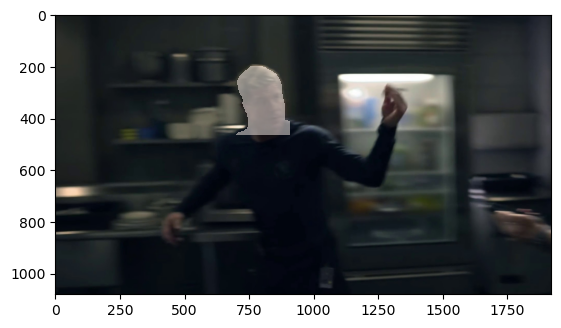

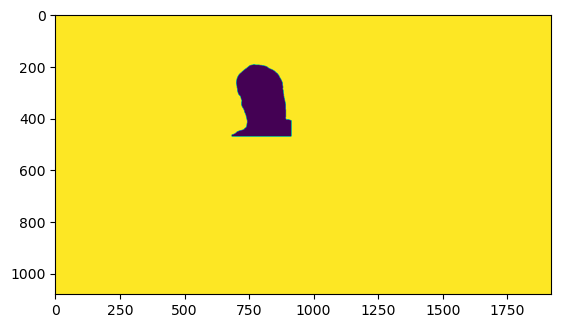

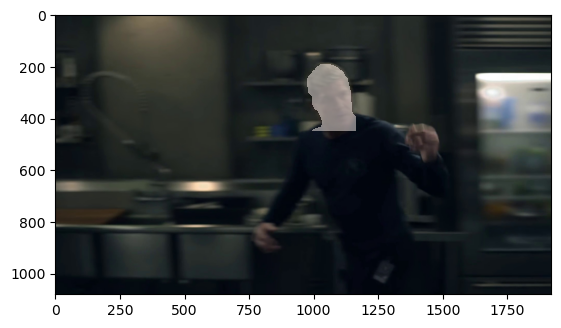

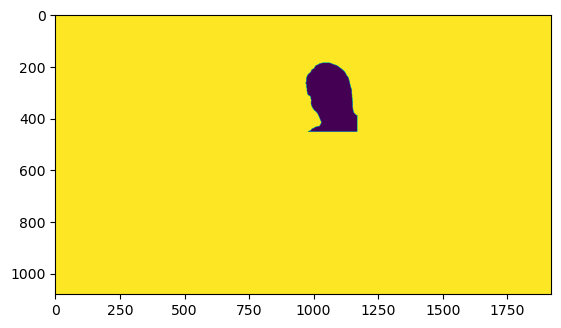

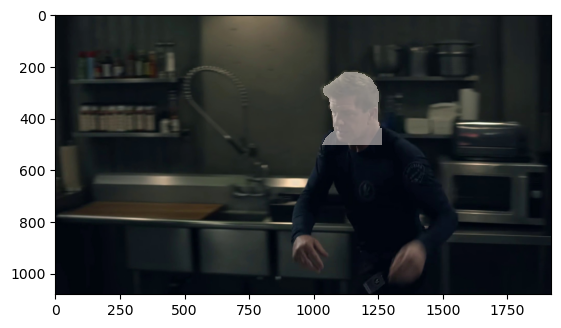

...

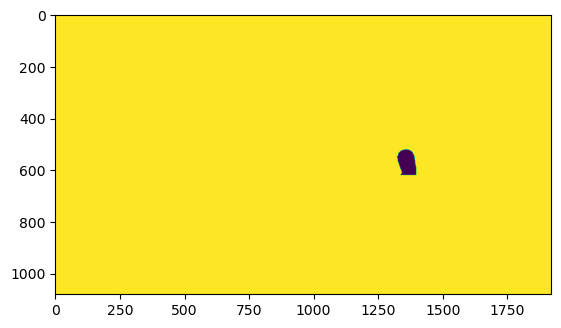

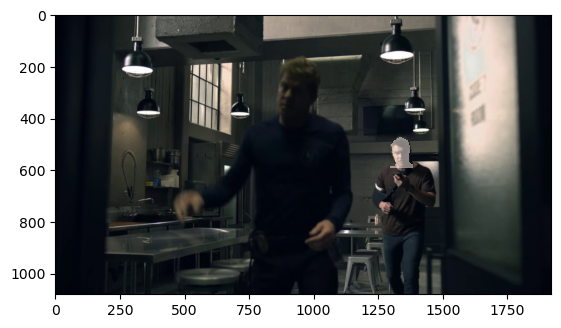

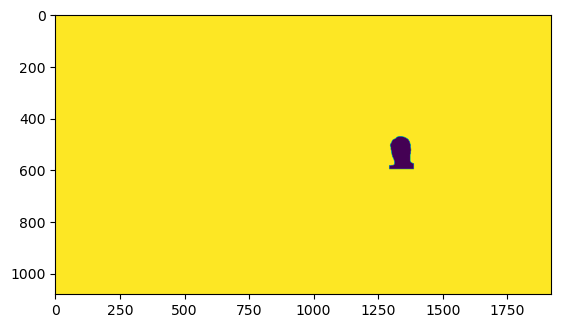

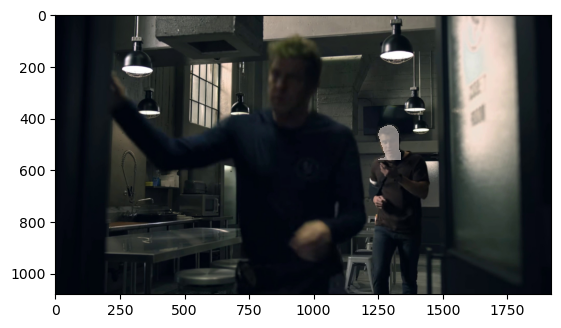

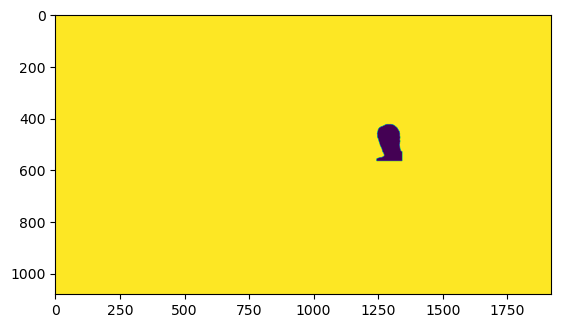

In [38]:
import json
from pycocotools.coco import COCO
from pycocotools import mask as mask_utils
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon
from matplotlib.collections import PatchCollection
from PIL import Image
import numpy as np

# Path to your COCO annotation file
annotation_file_path = r"D:\Master-Thesis_results_all\SAN\active_speaker-single\stuff_val2017.json"

# Load COCO annotations
coco = COCO(annotation_file_path)

# Get image IDs from the dataset
image_ids = coco.getImgIds()

# Display the first ten annotations on their respective images
for image_id in image_ids[:10]:
    # Load image
    image_info = coco.loadImgs(image_id)[0]
    image_path = r"D:\Master_Thesis_data\Active_Speaker\data\val\images\\" + image_info['file_name']
    image = Image.open(image_path)
    
    # Load annotations for the image
    annotation_ids = coco.getAnnIds(imgIds=image_id)
    annotations = coco.loadAnns(annotation_ids)

    # Display image
    plt.imshow(image)

    # Display annotations on top of the image
    for annotation in annotations:
        # Decode RLE mask
        binary_mask = decode(annotation['segmentation'])

        plt.imshow(np.ma.masked_array(binary_mask, binary_mask == 0), alpha=0.5, cmap='Reds')  # Adjust the colormap as needed
        plt.show()
        #plt.savefig(output_path + item["file_name"].split("/")[-1].replace('.jpg', f'_{k}.jpg'))
         # Close the plot to free up resources
        
    image_path = r"D:\Master_Thesis_data\Active_Speaker\pixelmaps\val\\" + image_info['file_name'].replace(".jpg", ".png")
    image = Image.open(image_path)
    plt.imshow(image)
    plt.show()
    
plt.close() 

In [28]:
data["annotations"]

[{'segmentation': {'size': [1080, 1920],
   'counts': 'bjRU1h3om01O1O1O1N2N2nNcLgSO_3Tl0U1K5M3M3M3M3M3O1O1O1O100N2O1O1O1O1O1N2N2M3L4L4N2O1O1N2N2M3M3O1N2N2O1N2N2O1N2O1N2O1O1O1N2N2O1N2O1O1O1O1O1N2O100O1O100O1O1O100O100O100O10000O100000000O100000000O10000O1000000O1000000000000O100001O000000000000000000000000000000001O0000001O0000001O000000001O00000000001O001O1O001O1O1O00001O001O001O1O001O1O1O1O001SMXVOhMii0U2YVOkMhi0S2YVOmMhi0n1\\VORNei0j1^VOVNci0f1`VOZNai0c1aVO]N`i0_1cVOaN^i0\\1dVOdN]i0X1fVOhN[i0V1gVOiNZi0T1hVOlNYi0Q1iVOoNYi0m0iVOSOXi03lUOeMP1W2Ui01nUOcMQ1\\2Ri0NRVO]MR1e2mh0KfWO4\\h0GhWO8Zh0AkWO?Wh0]OlWOb0Vh0ZOlWOf0Vh0UOnWOj0Uh0kNSXOU1Qh0cNTXO\\1Qh0XNVXOh1Vh0dMSXO[2ek00001O2N1Oe`ic0'},
  'area': 45403.0,
  'iscrowd': 0,
  'image_id': 264,
  'bbox': [1125.971058644326,
   155.003808073115,
   194.48591012947452,
   279.29931454683924],
  'category_id': 1,
  'id': 264},
 {'segmentation': {'size': [1080, 1920],
   'counts': 'WkZ<g4Pm0100O100O100O100_KaKh[O`4Rd0kKi[OU4hc0`LQ\\Oa3kc0gLP\\OZ3l

In [4]:
data

[{'file_name': 'datasets/coco/val2017/00b20bcd-2145.jpg',
  'category_id': 1,
  'segmentation': {'size': [1080, 1920], 'counts': '0PPYo1'}},
 {'file_name': 'datasets/coco/val2017/014cdb86-2000.jpg',
  'category_id': 1,
  'segmentation': {'size': [1080, 1920], 'counts': '0PPYo1'}},
 {'file_name': 'datasets/coco/val2017/0286daae-1963.jpg',
  'category_id': 1,
  'segmentation': {'size': [1080, 1920], 'counts': '0PPYo1'}},
 {'file_name': 'datasets/coco/val2017/0301ce39-2134.jpg',
  'category_id': 1,
  'segmentation': {'size': [1080, 1920], 'counts': '0PPYo1'}},
 {'file_name': 'datasets/coco/val2017/04b99558-1943.jpg',
  'category_id': 1,
  'segmentation': {'size': [1080, 1920],
   'counts': '0\\=V1lIn2n=RMRBn2n=RMRBn2n=RMRBn2n=RMRBn2n=RMRBn2n=RMRBn2n=RMRBn2n=RMRBn2n=RMRBn2n=RMRBn2n=RMRBn2n=RMRBn2n=RMRBn2o=QMQBn2P>QMQBo2P>PMoAQ3Q>oLoAP3S>oLmAQ3S>oLmAQ3T>nLlAQ3U>nLlAR3U>mLkAR3V>nLjAR3V>nLjAR3W>mLiAR3X>nLhAR3X>mLiAR3Y>mLgAR3Z>nLfAP3\\>PMdAl2a>SM_Ai2e>WMZAh2h>WMYAg2j>XMVAf2l>ZMTAd2n>\\MRAc2o>]

filename: datasets/coco/val2017/f6846c48-2143.jpg


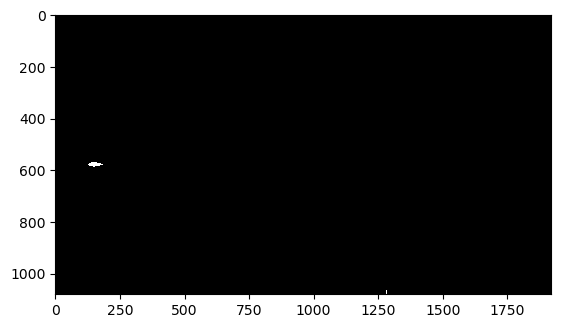

In [5]:
import numpy as np
import matplotlib.pyplot as plt

# Convert 0 to 255
print(f"filename: {data[-7]['file_name']}")
my_array = decode(data[-8]["segmentation"])
my_array[0, 0] = 0
my_array[my_array==0] = 255
my_array[my_array==1] = 1

# Display the image
plt.imshow(my_array, cmap='gray', interpolation='nearest')
# plt.imshow(my_array)
plt.show()

In [66]:
# decode(data[-8]["segmentation"])
print(my_array)

[[255   1   1 ...   1   1   1]
 [  1   1   1 ...   1   1   1]
 [  1   1   1 ...   1   1   1]
 ...
 [  1   1   1 ...   1   1   1]
 [  1   1   1 ...   1   1   1]
 [  1   1   1 ...   1   1   1]]


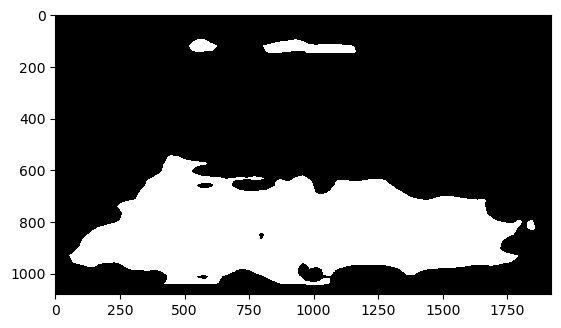

In [10]:
import numpy as np
import matplotlib.pyplot as plt

# Convert 0 to 255
my_array = decode(data[1]["segmentation"]) * 255

# Display the image
plt.imshow(my_array, cmap='gray', interpolation='nearest')
plt.show()

In [17]:
data[3]

{'file_name': 'datasets/coco/val2017/1908.jpg',
 'category_id': 1,
 'segmentation': {'size': [1080, 1920],
  'counts': 'ci0[1]P1000000000000000000000001N2N2L4M8Hf0YOelc1<QS\\N100O10000O1000000O10000000C=Negg60TXXI;N100O100O101N100O1O101N100O1O2O0O1O2O0O1O1O010O001O01O01O0001O01O01O3N6I3M100O1O1O010O001O01O01O1N2N2N2N1O2N2OjP_83Ro`G8H:F>B2O1O000000000001O0000000000001O01O000001O01O01O01O0100N2N2M3L4C=J7KdPf3NaoYL1N1O2O1N2N2N2N1O2M3N2M2O2M3eNVOdQOm0Yn0ZO`QOh0_n0\\O]QOf0an0\\O^QOf0`n0\\O]QOf0an0\\O]QOf0bn0\\O\\QOe0bn0]O\\QOf0bn0[O\\QOg0bn0\\O[QOg0bn0[O]QOi0_n0XO_QOn0[n0TOcQOQ1Yn0QOdQOR1Yn0POfQOS1Wn0Y1M3bN_LaTOb3]k0`LaTOb3]k0`LbTOb3Zk0aLdTOa3Zk0aLeTO`3Yk0bLeTO`3Yk0aLgTO`3Vk0cLhTO^3Wk0dLhTO]3Vk0eLhTO]3Vk0eLiTO\\3Vk0dLjTO]3Uk0cLkTO_3Tk0_LmTOb3Sk0\\LnTOe3Rk0XLQUOi3oj0TLRUOm3oj0PLSUOP4nj0mKSUOU4mj0hKTUOY4Vl00O100O1O2O0O1O101N1O2O1N101N1O100O100O100O010O010O01O01OeKaSO]3`l0\\LhSOc3Wl0ZLoSOc3Ql0ZLTTOe3lk0XLXTOf3ik0XLZTOf3nl0O2M2N2O2M2N2O0O1O100O1O101N1O1O1O010O1O010O00001O0001O01J[QOWMen0h26O1O1

In [7]:
from pycocotools.coco import COCO
coco = COCO(r"D:\Master-Thesis_results_all\SAN\active_speaker-single\sem_seg_predictions.json")

loading annotations into memory...


AssertionError: annotation file format <class 'list'> not supported